In [1]:
import matplotlib
matplotlib.use('agg') 

import pandas as pd
import cartopy.crs as ccrs
import cartopy
import matplotlib.pyplot as plt
import pandana as pdna
import time

import urbanaccess as ua
from urbanaccess.config import settings
from urbanaccess.gtfsfeeds import feeds
from urbanaccess import gtfsfeeds
from urbanaccess.gtfs.gtfsfeeds_dataframe import gtfsfeeds_dfs
from urbanaccess.network import ua_network, load_network

%matplotlib inline

#Import necessary libraries

C:\anaconda\envs\ox\lib\site-packages\ipykernel\parentpoller.py:109: UserWarning: Parent poll failed.  If the frontend dies,
                the kernel may be left running.  Please let us know
                about your system (bitness, Python, etc.) at
                ipython-dev@scipy.org
  warnings.warn("""Parent poll failed.  If the frontend dies,


## The settings object

The `settings` object is a global `urbanaccess_config` object that can be used to set default options in UrbanAccess. In general, these options do not need to be changed.

Here we will access GTFS data for the VTA, Valley Transit Authority the primary public transit service that serves the South Bay Area

In [2]:
feeds.add_feed(add_dict={'VTA': 'https://gtfs.vta.org/gtfs_vta.zip'})

Added 1 feeds to gtfs_feeds: {'VTA': 'https://gtfs.vta.org/gtfs_vta.zip'}


Note the two GTFS feeds now in your feeds object ready to download

In [3]:
feeds.to_dict()

{'gtfs_feeds': {'VTA': 'https://gtfs.vta.org/gtfs_vta.zip'}}

# Downloading GTFS data

Use the download function to download all the feeds in your feeds object at once. If no parameters are specified the existing feeds object will be used to acquire the data.

By default, your data will be downloaded into the directory of this notebook in the folder: `data`

In [4]:
gtfsfeeds.download()

1 GTFS feed(s) will be downloaded here: data\gtfsfeed_zips
VTA GTFS feed downloaded successfully. Took 1.13 seconds for 4,603,184.0KB
GTFS feed download completed. Took 1.14 seconds
VTA.zip successfully extracted to: data\gtfsfeed_text\VTA
GTFS feed zipfile extraction completed. Took 0.50 seconds for 1 files


# Load GTFS data into an UrbanAccess transit data object

Now that we have downloaded our data let's load our individual GTFS feeds (currently a series of text files stored on disk) into a combined network of Pandas DataFrames.

- You can specify one feed or multiple feeds that are inside a root folder using the `gtfsfeed_path` parameter. If you want to aggregate multiple transit networks together, all the GTFS feeds you want to aggregate must be inside of a single root folder.
- Turn on `validation` and set a bounding box with the `remove_stops_outsidebbox` parameter turned on to ensure all your GTFS feed data are within a specified area.

Let's specify a bounding box of coordinates for the prescribed transit desert area to subset the GTFS data to. You can generate a bounding box by going to http://boundingbox.klokantech.com/ and selecting the CSV format.

## Bounding Box for Transit Desert (Northern parts of Palo Alto, Mountain View, Sunnyvale, Santa Clara, San Jose, and Milpitas) surrounded by Highway 101, 85, and 880.
## From Facebook in top left down to Linkedin to Cisco in the right

In [65]:
validation = True
verbose = True

bbox = (-122.18,37.37,-121.9,37.489) #obtained by approximation using Google Maps
remove_stops_outsidebbox = True
append_definitions = True

loaded_feeds = ua.gtfs.load.gtfsfeed_to_df(gtfsfeed_path=None,
                                           validation=validation,
                                           verbose=verbose,
                                           bbox=bbox,
                                           remove_stops_outsidebbox=remove_stops_outsidebbox,
                                           append_definitions=append_definitions)

Checking GTFS text file header whitespace... Reading files using encoding: utf-8 set in configuration.
GTFS text file header whitespace check completed. Took 0.53 seconds
--------------------------------
Processing GTFS feed: VTA
The unique agency id: vta was generated using the name of the agency in the agency.txt file.
Unique agency id operation complete. Took 0.12 seconds
Unique GTFS feed id operation complete. Took 0.02 seconds
Records:
      stop_id  stop_code                      stop_name stop_desc   stop_lat  \
0     EL_BLSM        NaN  Blossom Hill Station Elevator       NaN  37.252569   
1     EL_BRNM        NaN       Branham Station Elevator       NaN  37.266430   
2     EL_CPTL        NaN       Capitol Station Elevator       NaN  37.274233   
3     EL_CTTL        NaN        Cottle Station Elevator       NaN  37.242774   
4     EL_SNLL        NaN         Snell Station Elevator       NaN  37.247580   
...       ...        ...                            ...       ...        ..

### The transit data object

The output is a global `urbanaccess_gtfs_df` object that can be accessed with the specified variable `loaded_feeds`. This object holds all the individual GTFS feed files aggregated together with each GTFS feed file type in separate Pandas DataFrames to represent all the loaded transit feeds in a metropolitan area. 

In [66]:
loaded_feeds.stops.head()

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,stop_url,location_type,parent_station,wheelchair_boarding,platform_code,sign_dest,unique_agency_id,unique_feed_id,route_type,location_type_desc,wheelchair_boarding_desc
0,PS_ALDR,NaN,Alder Station,NaN,37.413572,-121.917118,NaN,NaN,1,NaN,1,NaN,NaN,vta,vta_1,NaN,station,At least some vehicles at this stop can be boa...
1,PS_BAYP,NaN,Baypointe Station,NaN,37.410438,-121.942311,NaN,NaN,1,NaN,0,NaN,NaN,vta,vta_1,NaN,station,No accessibility information available for the...
2,PS_BONA,NaN,Bonaventura Station,NaN,37.388749,-121.929742,NaN,NaN,1,NaN,0,NaN,NaN,vta,vta_1,NaN,station,No accessibility information available for the...
3,PS_BORR,NaN,Borregas Station,NaN,37.411326,-122.016702,NaN,NaN,1,NaN,0,NaN,NaN,vta,vta_1,NaN,station,No accessibility information available for the...
4,PS_CHMP,NaN,Champion Station,NaN,37.408898,-121.951936,NaN,NaN,1,NaN,0,NaN,NaN,vta,vta_1,NaN,station,No accessibility information available for the...


Note the two transit services we have aggregated into one regional table

Quickly view the transit stop locations

<AxesSubplot:xlabel='stop_lon', ylabel='stop_lat'>

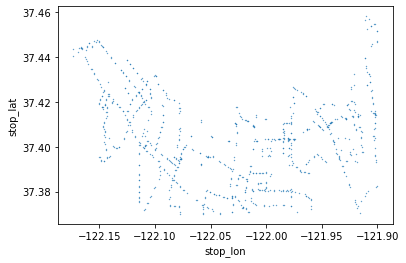

In [67]:
loaded_feeds.stops.plot(kind='scatter', x='stop_lon', y='stop_lat', s=0.1)

In [68]:
loaded_feeds.routes

,route_id,agency_id,route_short_name,route_long_name,route_desc,route_type,route_url,route_color,route_text_color,route_sort_order,ext_route_type,unique_agency_id,unique_feed_id,route_type_desc
0,BlueN,VTA,Blue Line N,Gish - Baypointe,Use the substitute bus bridge in place due to ...,0,https://www.vta.org/go/routes/blue-line,4cb4e7,000000,1,110,vta,vta_1,Street Level Rail: Tram Streetcar Light rail
1,BlueS,VTA,Blue Line S,Santa Teresa - Civic Center,Use the substitute bus bridge in place due to ...,0,https://www.vta.org/go/routes/blue-line,4cb4e7,000000,1,110,vta,vta_1,Street Level Rail: Tram Streetcar Light rail
2,Blue,VTA,Blue Line,Baypointe - Santa Teresa,NaN,0,https://www.vta.org/go/routes/blue-line,4cb4e7,000000,1,900,vta,vta_1,Street Level Rail: Tram Streetcar Light rail
3,GrenN,VTA,Green Line N,Gish - Old Ironsides,Use the substitute bus bridge in place due to ...,0,https://www.vta.org/go/routes/green-line,73c92d,000000,2,110,vta,vta_1,Street Level Rail: Tram Streetcar Light rail
4,GrenS,VTA,Green Line S,Winchester - Civic Center,Use the substitute bus bridge in place due to ...,0,https://www.vta.org/go/routes/green-line,73c92d,000000,2,110,vta,vta_1,Street Level Rail: Tram Streetcar Light rail
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,825,VTA,ACE Purple,Great America ACE Station - West Milpitas,NaN,3,NaN,263996,FFFFFF,825,711,vta,vta_1,Bus
68,826,VTA,ACE Red,Great America ACE Station - North Sunnyvale,NaN,3,NaN,d60e51,FFFFFF,826,711,vta,vta_1,Bus
69,827,VTA,ACE Yellow,Great America ACE Station - South Santa Clara,NaN,3,NaN,ffe601,000000,827,711,vta,vta_1,Bus
70,828,VTA,ACE Brown,Great America ACE Station - South Sunnyvale,NaN,3,NaN,6d4739,FFFFFF,828,711,vta,vta_1,Bus


In [69]:
loaded_feeds.stop_times.head()

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint,unique_agency_id,unique_feed_id,route_type,pickup_type_desc,drop_off_type_desc,timepoint_desc,departure_time_sec
0,3178231,05:38:00,05:38:00,4753,2,NaN,0,0,1.0118,1,vta,vta_1,0,Regularly Scheduled,Regularly Scheduled,Exact times,20280
1,3178231,05:39:23,05:39:23,4754,3,NaN,0,0,1.7792,0,vta,vta_1,0,Regularly Scheduled,Regularly Scheduled,Approximate times,20363
2,3178231,05:41:05,05:41:05,4755,4,NaN,0,0,2.7143,0,vta,vta_1,0,Regularly Scheduled,Regularly Scheduled,Approximate times,20465
3,3178231,05:42:20,05:42:20,4756,5,NaN,0,0,3.3992,0,vta,vta_1,0,Regularly Scheduled,Regularly Scheduled,Approximate times,20540
4,3178231,05:43:58,05:43:58,4757,6,NaN,0,0,4.3020,0,vta,vta_1,0,Regularly Scheduled,Regularly Scheduled,Approximate times,20638


In [70]:
loaded_feeds.trips.head()

,route_id,service_id,trip_id,trip_headsign,direction_id,block_id,shape_id,wheelchair_accessible,bikes_allowed,unique_agency_id,unique_feed_id,bikes_allowed_desc,wheelchair_accessible_desc
0,BlueN,148801,3178231,BAYPOINTE,0,9201,105224,0,0,vta,vta_1,None,None
1,BlueN,148801,3178232,BAYPOINTE,0,9202,105224,0,0,vta,vta_1,None,None
2,BlueN,148802,3177386,BAYPOINTE,0,9202,105224,0,0,vta,vta_1,None,None
3,BlueN,148801,3178233,BAYPOINTE,0,9230,105224,0,0,vta,vta_1,None,None
4,BlueN,148802,3177387,BAYPOINTE,0,9203,105224,0,0,vta,vta_1,None,None


In [71]:
loaded_feeds.calendar.head()

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date,unique_agency_id,unique_feed_id
0,1,1,1,1,1,1,0,0,20220214,20220610,vta,vta_1
1,10201,1,0,1,1,0,0,0,20220214,20220525,vta,vta_1
2,10301,0,1,0,0,1,0,0,20220215,20220610,vta,vta_1
3,10801,1,0,0,1,0,0,0,20220214,20220525,vta,vta_1
4,10901,0,1,1,0,1,0,0,20220215,20220610,vta,vta_1


# Create a transit network

Now that we have loaded and standardized our GTFS data, let's create a travel time weighted graph from the GTFS feeds we have loaded.

Create a network for weekday `monday` service between 7 am and 10 am (`['07:00:00', '10:00:00']`) to represent travel times during the AM Peak period.

Assumptions: We are using the service ids in the `calendar` file to subset the day of week, however if your feed uses the `calendar_dates` file and not the `calendar` file then you can use the `calendar_dates_lookup` parameter. 

In [72]:
ua.gtfs.network.create_transit_net(gtfsfeeds_dfs=loaded_feeds,
                                   day='monday',
                                   timerange=['07:00:00', '10:00:00'],
                                   calendar_dates_lookup=None)

Using calendar to extract service_ids to select trips.
58 service_ids were extracted from calendar
4,376 trip(s) 48.07 percent of 9,103 total trip records were found in calendar for GTFS feed(s): ['vta']
NOTE: If you expected more trips to have been extracted and your GTFS feed(s) have a calendar_dates file, consider utilizing the calendar_dates_lookup parameter in order to add additional trips based on information inside of calendar_dates. This should only be done if you know the corresponding GTFS feed is using calendar_dates instead of calendar to specify service_ids. When in doubt do not use the calendar_dates_lookup parameter.
4,376 of 9,103 total trips were extracted representing calendar day: monday. Took 0.09 seconds
There are no departure time records missing from trips following the specified schedule. There are no records to interpolate.
Difference between stop times has been successfully calculated. Took 1.23 seconds
Stop times from 07:00:00 to 10:00:00 successfully selecte

### The UrbanAccess network object

The output is a global `urbanaccess_network` object. This object holds the resulting graph comprised of nodes and edges for the processed GTFS network data for services operating at the day and time you specified inside of `transit_edges` and `transit_nodes`.

Let's set the global network object to a variable called `urbanaccess_net` that we can then inspect:

In [73]:
urbanaccess_net = ua.network.ua_network

In [74]:
urbanaccess_net.transit_edges.head()

,node_id_from,node_id_to,weight,unique_agency_id,unique_trip_id,sequence,id,route_type,unique_route_id,net_type
0,4434_vta,4435_vta,0.250000,vta,3156429_vta,1,3156429_vta_1,3,101_vta,transit
1,4435_vta,4436_vta,0.300000,vta,3156429_vta,2,3156429_vta_2,3,101_vta,transit
2,4436_vta,4342_vta,0.333333,vta,3156429_vta,3,3156429_vta_3,3,101_vta,transit
3,4342_vta,4343_vta,1.066667,vta,3156429_vta,4,3156429_vta_4,3,101_vta,transit
4,4343_vta,4344_vta,0.916667,vta,3156429_vta,5,3156429_vta_5,3,101_vta,transit


In [75]:
urbanaccess_net.transit_nodes.head()

,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type
node_id,,,,,,,,,,,,
327_vta,-122.168376,37.444098,vta,3.0,327,El Camino and Stanford Shopping Center,NaN,60327.0,1,NaN,0,transit
328_vta,-122.165763,37.443750,vta,3.0,328,Palo Alto Transit Center (Bay 10),PS_PATC,60328.0,1,NaN,0,transit
329_vta,-122.162394,37.439113,vta,3.0,329,El Camino & Palm,NaN,60329.0,1,NaN,0,transit
330_vta,-122.159821,37.436861,vta,3.0,330,El Camino & Galvez,NaN,60330.0,1,NaN,0,transit
331_vta,-122.157257,37.434625,vta,3.0,331,El Camino & Sam McDonald,NaN,60331.0,1,NaN,0,transit


<AxesSubplot:xlabel='x', ylabel='y'>

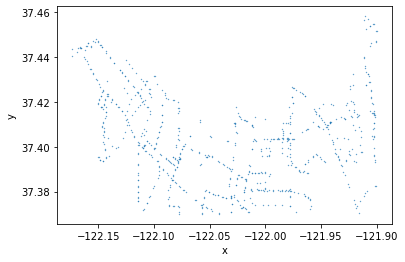

In [76]:
urbanaccess_net.transit_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# Download OSM data

Now let's download OpenStreetMap (OSM) pedestrian street network data to produce a graph network of nodes and edges for the South Bay Area, CA. We will use the same bounding box as before.

In [77]:
nodes, edges = ua.osm.load.ua_network_from_bbox(bbox=bbox,
                                                remove_lcn=True)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](37.37000000,-122.18000000,37.48900000,-121.90000000);>;);out;'}"
Downloaded 39,660.3KB from www.overpass-api.de in 14.91 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 18.96 seconds
Returning OSM data with 244,346 nodes and 56,693 ways...
Edge node pairs completed. Took 284.75 seconds
Returning processed graph with 77,333 nodes and 222,136 edges...
Completed OSM data download and Pandana node and edge table creation in 317.95 seconds
checking for low connectivity nodes...
126 out of 77,333 nodes (0.16 percent of total) were identified as having low connectivity and have been removed.
Completed OSM data download and graph node and edge table

# Create a pedestrian network

Now that we have our pedestrian network data let's create a travel time weighted graph from the pedestrian network we have loaded and add it to our existing UrbanAccess network object. We will assume a pedestrian travels on average at 3 mph.

The resulting weighted network will be added to your UrbanAccess network object inside `osm_nodes` and `osm_edges`

In [78]:
ua.osm.network.create_osm_net(osm_edges=edges,
                              osm_nodes=nodes,
                              travel_speed_mph=3)

Created OSM network with travel time impedance using a travel speed of 3 MPH. Took 0.02 seconds


Let's inspect the results which we can access inside of the existing `urbanaccess_net` variable:

In [79]:
urbanaccess_net.osm_nodes

,x,y,id,net_type
id,,,,
26027651,-122.102672,37.418131,26027651,walk
26027653,-122.108639,37.407976,26027653,walk
26027655,-122.110121,37.406998,26027655,walk
26027656,-122.113611,37.401380,26027656,walk
26027657,-122.102281,37.419098,26027657,walk
...,...,...,...,...
9668014606,-121.970201,37.379350,9668014606,walk
9668771316,-121.926268,37.403882,9668771316,walk
9668819619,-121.926320,37.403839,9668819619,walk


In [80]:
urbanaccess_net.osm_edges

from          to    distance                name  \
5288682196 26029084    5288682196    26029084   78.735931                 NaN   
26029084   5288682196    26029084  5288682196   78.735931                 NaN   
26028708   26678537      26028708    26678537   94.896203  Central Expressway   
26678537   26028708      26678537    26028708   94.896203  Central Expressway   
33373953   33003981      33373953    33003981  189.960980  Central Expressway   
...                           ...         ...         ...                 ...   
9668819619 9668819622  9668819619  9668819622    6.609043                 NaN   
           9668771316  9668819619  9668771316    6.611757                 NaN   
9668771316 9668819619  9668771316  9668819619    6.611757                 NaN   
           9668819625  9668771316  9668819625    6.609041                 NaN   
9668819625 9668771316  9668819625  9668771316    6.609041                 NaN   

                       ref         highway   service bridge tunnel access  \
5288682196 26029084    NaN  secondary_link       NaN    yes    NaN    NaN   
26029084   5288682196  NaN  secondary_link       NaN    yes    NaN    NaN   
26028708   26678537     G6         primary       NaN    NaN    NaN    NaN   
26678537   26028708     G6         primary       NaN    NaN    NaN    NaN   
33373953   33003981     G6           trunk       NaN    NaN    NaN    NaN   
...                    ...             ...       ...    ...    ...    ...   
9668819619 9668819622  NaN         service  driveway    NaN    NaN    NaN   
           9668771316  NaN         service  driveway    NaN    NaN    NaN   
9668771316 9668819619  NaN         service  driveway    NaN    NaN    NaN   
           9668819625  NaN         service  driveway    NaN    NaN    NaN   
9668819625 9668771316  NaN         service  driveway    NaN    NaN    NaN   

                      oneway toll lanes maxspeed  hgv  hov area width  \
5288682196 26029084      yes  NaN     1      NaN  NaN  NaN  NaN   NaN   
26029084   5288682196    yes  NaN     1      NaN  NaN  NaN  NaN   NaN   
26028708   26678537      yes  NaN     2   35 mph  NaN  NaN  NaN   NaN   
26678537   26028708      yes  NaN     2   35 mph  NaN  NaN  NaN   NaN   
33373953   33003981      yes  NaN     2   50 mph  NaN  NaN  NaN   NaN   
...                      ...  ...   ...      ...  ...  ...  ...   ...   
9668819619 9668819622    NaN  NaN   NaN      NaN  NaN  NaN  NaN   NaN   
           9668771316    NaN  NaN   NaN      NaN  NaN  NaN  NaN   NaN   
9668771316 9668819619    NaN  NaN   NaN      NaN  NaN  NaN  NaN   NaN   
           9668819625    NaN  NaN   NaN      NaN  NaN  NaN  NaN   NaN   
9668819625 9668771316    NaN  NaN   NaN      NaN  NaN  NaN  NaN   NaN   

                      est_width junction    weight net_type  
5288682196 26029084         NaN      NaN  0.978487     walk  
26029084   5288682196       NaN      NaN  0.978487     walk  
26028708   26678537         NaN      NaN  1.179318     walk  
26678537   26028708         NaN      NaN  1.179318     walk  
33373953   33003981         NaN      NaN  2.360731     walk  
...                         ...      ...       ...      ...  
9668819619 9668819622       NaN      NaN  0.082134     walk  
           9668771316       NaN      NaN  0.082167     walk  
9668771316 9668819619       NaN      NaN  0.082167     walk  
           9668819625       NaN      NaN  0.082134     walk  
9668819625 9668771316       NaN      NaN  0.082134     walk  

[221906 rows x 22 columns]

<AxesSubplot:xlabel='x', ylabel='y'>

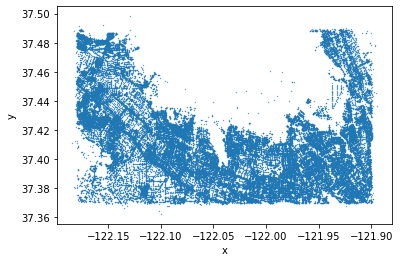

In [81]:
urbanaccess_net.osm_nodes.plot(kind='scatter', x='x', y='y', s=0.1)

# Create an integrated transit and pedestrian network

Now let's integrate the two networks together. The resulting graph will be added to your existing UrbanAccess network object. After running this step, your network will be ready to be used with Pandana.

The resulting integrated network will be added to your UrbanAccess network object inside `net_nodes` and `net_edges`

In [82]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=False)

Loaded UrbanAccess network components comprised of:
     Transit: 789 nodes and 6,922 edges;
     OSM: 77,207 nodes and 221,906 edges
Connector edges between the OSM and transit network nodes successfully completed. Took 1.84 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 7.31 seconds
Network edge and node network integration completed successfully resulting in a total of 77,996 nodes and 230,406 edges:
     Transit: 789 nodes 6,922 edges;
     OSM: 77,207 nodes 221,906 edges; and
     OSM/Transit connector: 1,578 edges.


Let's inspect the results which we can access inside of the existing `urbanaccess_net` variable:

In [83]:
urbanaccess_net.net_nodes

,id,x,y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type
id_int,,,,,,,,,,,,,
1,327_vta,-122.168376,37.444098,vta,3.0,327,El Camino and Stanford Shopping Center,NaN,60327.0,1.0,NaN,0.0,transit
2,328_vta,-122.165763,37.443750,vta,3.0,328,Palo Alto Transit Center (Bay 10),PS_PATC,60328.0,1.0,NaN,0.0,transit
3,329_vta,-122.162394,37.439113,vta,3.0,329,El Camino & Palm,NaN,60329.0,1.0,NaN,0.0,transit
4,330_vta,-122.159821,37.436861,vta,3.0,330,El Camino & Galvez,NaN,60330.0,1.0,NaN,0.0,transit
5,331_vta,-122.157257,37.434625,vta,3.0,331,El Camino & Sam McDonald,NaN,60331.0,1.0,NaN,0.0,transit
...,...,...,...,...,...,...,...,...,...,...,...,...,...
77992,9668014606,-121.970201,37.379350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
77993,9668771316,-121.926268,37.403882,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
77994,9668819619,-121.926320,37.403839,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk


In [28]:
urbanaccess_net.net_edges

,from,to,weight,unique_agency_id,unique_trip_id,sequence,edge_id,route_type,unique_route_id,net_type,...,lanes,maxspeed,hgv,hov,area,width,est_width,junction,from_int,to_int
0,4434_vta,4435_vta,0.250000,vta,3156429_vta,1.0,3156429_vta_1,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,607,608
1,4435_vta,4436_vta,0.300000,vta,3156429_vta,2.0,3156429_vta_2,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,608,609
2,4436_vta,4342_vta,0.333333,vta,3156429_vta,3.0,3156429_vta_3,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,609,573
3,4342_vta,4343_vta,1.066667,vta,3156429_vta,4.0,3156429_vta_4,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,573,574
4,4343_vta,4344_vta,0.916667,vta,3156429_vta,5.0,3156429_vta_5,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,574,575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230401,8568485309,6052_vta,0.013330,nan,nan,NaN,nan,NaN,nan,osm to transit,...,nan,nan,nan,nan,nan,nan,nan,nan,71997,787
230402,6053_vta,8568485304,0.122981,nan,nan,NaN,nan,NaN,nan,transit to osm,...,nan,nan,nan,nan,nan,nan,nan,nan,788,71993
230403,8568485304,6053_vta,0.122981,nan,nan,NaN,nan,NaN,nan,osm to transit,...,nan,nan,nan,nan,nan,nan,nan,nan,71993,788
230404,6054_vta,7472479643,0.123750,nan,nan,NaN,nan,NaN,nan,transit to osm,...,nan,nan,nan,nan,nan,nan,nan,nan,789,67008


In [29]:
urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type'] == 'transit']

,from,to,weight,unique_agency_id,unique_trip_id,sequence,edge_id,route_type,unique_route_id,net_type,...,lanes,maxspeed,hgv,hov,area,width,est_width,junction,from_int,to_int
0,4434_vta,4435_vta,0.250000,vta,3156429_vta,1.0,3156429_vta_1,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,607,608
1,4435_vta,4436_vta,0.300000,vta,3156429_vta,2.0,3156429_vta_2,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,608,609
2,4436_vta,4342_vta,0.333333,vta,3156429_vta,3.0,3156429_vta_3,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,609,573
3,4342_vta,4343_vta,1.066667,vta,3156429_vta,4.0,3156429_vta_4,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,573,574
4,4343_vta,4344_vta,0.916667,vta,3156429_vta,5.0,3156429_vta_5,3.0,101_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,574,575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6917,5250_vta,4804_vta,2.933333,vta,3178700_vta,1.0,3178700_vta_1,0.0,Ornge_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,717,681
6918,4804_vta,4805_vta,2.133333,vta,3178700_vta,2.0,3178700_vta_2,0.0,Ornge_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,681,682
6919,4805_vta,4806_vta,2.533333,vta,3178700_vta,3.0,3178700_vta_3,0.0,Ornge_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,682,683
6920,4806_vta,4807_vta,2.666667,vta,3178700_vta,4.0,3178700_vta_4,0.0,Ornge_vta,transit,...,nan,nan,nan,nan,nan,nan,nan,nan,683,684


# Save the network to disk

You can save the final processed integrated network `net_nodes` and `net_edges` to disk inside of a HDF5 file. By default the file will be saved to the directory of this notebook in the folder `data`

In [30]:
ua.network.save_network(urbanaccess_network=urbanaccess_net,
                        filename='final_net.h5',
                        overwrite_key = True)

Using existing data/final_net.h5 hdf5 store.
Existing edges overwritten in data/final_net.h5 hdf5 store.
Using existing data/final_net.h5 hdf5 store.
Existing nodes overwritten in data/final_net.h5 hdf5 store.


# Load saved network from disk

You can load an existing processed integrated network HDF5 file from disk into a UrbanAccess network object.

In [31]:
urbanaccess_net = ua.network.load_network(filename='final_net.h5')

Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']
Successfully read store: data/final_net.h5 with the following keys: ['/edges', '/nodes']


# Visualize the network

You can visualize the network you just created using basic UrbanAccess plot functions

### Integrated network by travel time

Note the ability to see VTA's major bus arterial routes (in darker red) and transfer locations with the underlying pedestrian network. 

Figure created. Took 74.98 seconds


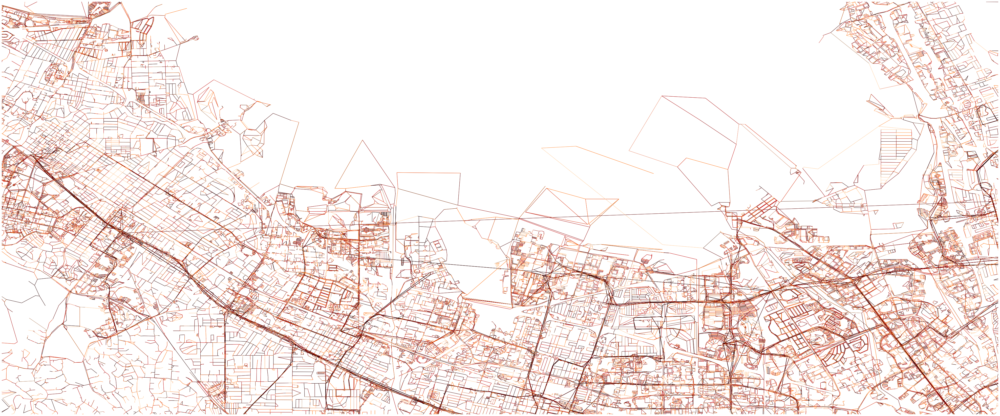

(<Figure size 5082.35x2160 with 1 Axes>, <AxesSubplot:>)

In [32]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

### Transit network

You can also slice the network by network type This clearly shows the 'Transit Desert'in the area with very minimal transit lines

Figure created. Took 2.43 seconds


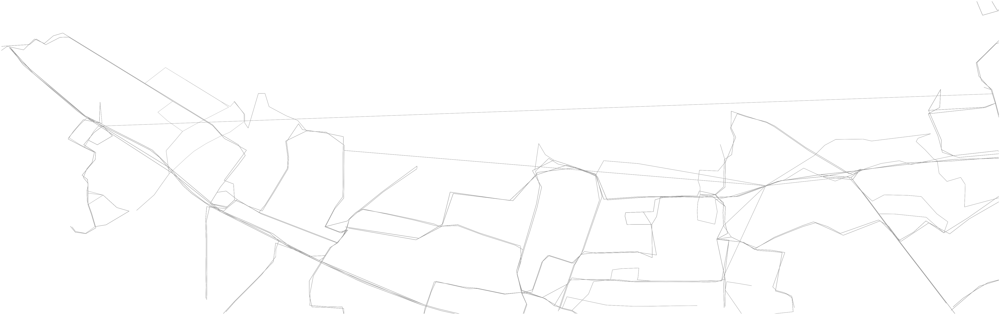

(<Figure size 6712.8x2160 with 1 Axes>, <AxesSubplot:>)

In [33]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='transit'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

### Pedestrian network

Figure created. Took 68.49 seconds


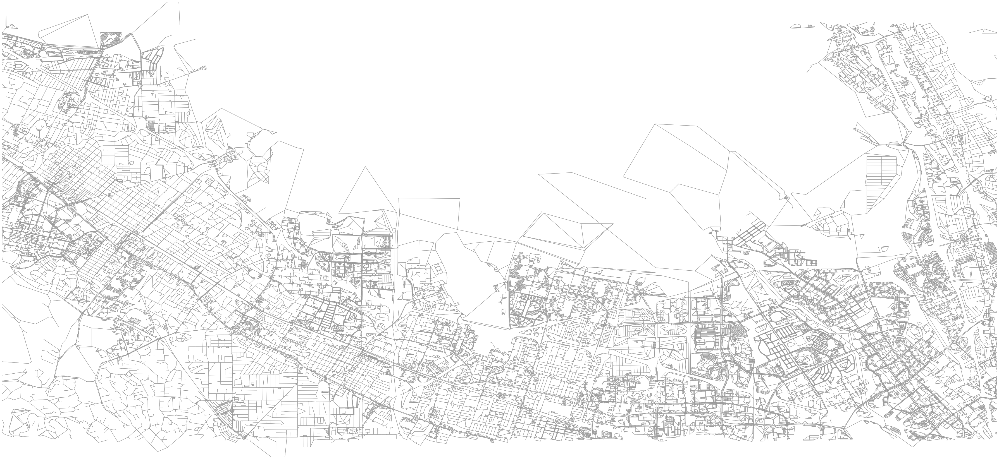

(<Figure size 4597.31x2160 with 1 Axes>, <AxesSubplot:>)

In [34]:
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges[urbanaccess_net.net_edges['net_type']=='walk'],
                 bbox=None,
                 fig_height=30, margin=0.02,
                 edge_color='#999999', edge_linewidth=1, edge_alpha=1,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# Add average headways to network travel time

### Calculate route stop level headways

The network we have generated so far only contains pure travel times. UrbanAccess allows for the calculation of and addition of route stop level average headways to the network. This is used as a proxy for passenger wait times at stops and stations. The route stop level average headway are added to the pedestrian to transit connector edges.

Let's calculate headways for the same AM Peak time period. Statistics on route stop level headways will be added to your GTFS transit data object inside of `headways`

In [37]:
ua.gtfs.headways.headways(gtfsfeeds_df=loaded_feeds,
                          headway_timerange=['07:00:00','10:00:00'])

Stop times from 07:00:00 to 10:00:00 successfully selected 7,406 records out of 35,380 total records (20.93 percent of total). Took 0.01 seconds
Starting route stop headway calculation for 1,099 route stops...
Route stop headway calculation complete. Took 7.43 seconds
headway calculation complete. Took 7.83 seconds


### Add the route stop level average headways to your integrated network

Now that headways have been calculated and added to your GTFS transit feed object, you can use them to generate a new integrated network that incorporates the headways within the pedestrian to transit connector edge travel times.

In [38]:
ua.network.integrate_network(urbanaccess_network=urbanaccess_net,
                             headways=True,
                             urbanaccess_gtfsfeeds_df=loaded_feeds,
                             headway_statistic='mean')

Loaded UrbanAccess network components comprised of:
     Transit: 789 nodes and 6,922 edges;
     OSM: 77,207 nodes and 221,906 edges
routes successfully joined to transit nodes. Took 0.09 seconds
Connector edges between the OSM and transit network nodes successfully completed. Took 2.50 seconds
mean route stop headway will be used for pedestrian to transit edge impedance.
Headway impedance calculation completed. Took 0.03 seconds
Edge and node tables formatted for Pandana with integer node ids: id_int, to_int, and from_int. Took 8.21 seconds
Network edge and node network integration completed successfully resulting in a total of 78,306 nodes and 237,333 edges:
     Transit: 1,099 nodes 6,922 edges;
     OSM: 77,207 nodes 221,906 edges; and
     OSM/Transit connector: 8,505 edges.


### Integrated network by travel time with average headways

Figure created. Took 72.88 seconds


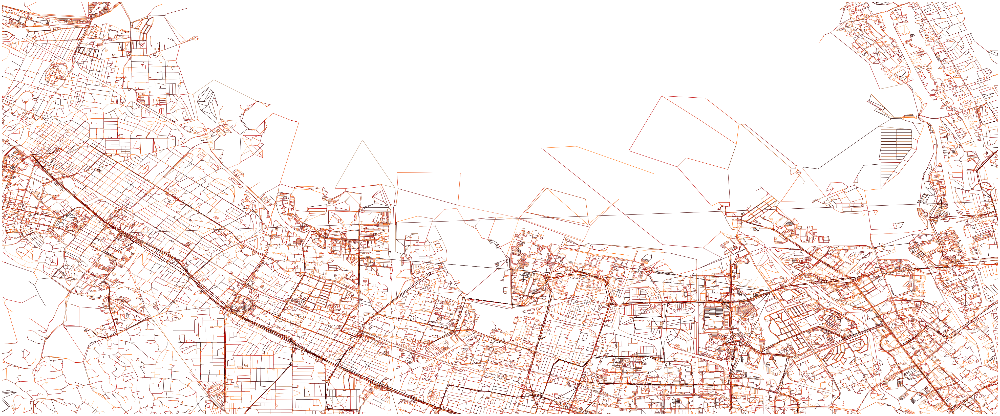

(<Figure size 5082.35x2160 with 1 Axes>, <AxesSubplot:>)

In [39]:
edgecolor = ua.plot.col_colors(df=urbanaccess_net.net_edges, col='weight', cmap='gist_heat_r', num_bins=5)
ua.plot.plot_net(nodes=urbanaccess_net.net_nodes,
                 edges=urbanaccess_net.net_edges,
                 bbox=bbox,
                 fig_height=30, margin=0.02,
                 edge_color=edgecolor, edge_linewidth=1, edge_alpha=0.7,
                 node_color='black', node_size=0, node_alpha=1, node_edgecolor='none', node_zorder=3, nodes_only=False)

# Using an UrbanAccess network with Pandana

Pandana (Pandas Network Analysis) is a tool to compute network accessibility metrics.

Now that we have an integrated transit and pedestrian network that has been formatted for use with Pandana, we can now use Pandana right away to compute accessibility metrics.

There are a couple of things to remember about UrbanAccess and Pandana:
- UrbanAccess generates by default a one way network. One way means there is an explicit edge for each direction in the edge table. Where applicable, it is important to set any Pandana `two_way` parameters to `False` (they are `True` by default) to indicate that the network is a one way network.
- As of Pandana v0.3.0, `node ids` and `from` and `to` columns in your network must be integer type and not string. UrbanAccess automatically generates both string and integer types so use the `from_int` and `to_int` columns in edges and the index in nodes `id_int`.
- UrbanAccess by default will generate edge weights that represent travel time in units of minutes.

For more on Pandana see the:

**Pandana repo:** https://github.com/UDST/pandana 

**Pandana documentation:** http://udst.github.io/pandana/

## Load Census block data

Let's load 2010 Census block data for the 9 county Bay Area. Note: These data have been processed from original Census and LEHD data.

The data is located in the `demo` folder on the repo with this notebook.

In [40]:
blocks = pd.read_hdf('bay_area_demo_data.h5','blocks')
# remove blocks that contain all water
blocks = blocks[blocks['square_meters_land'] != 0]
print('Total number of blocks: {:,}'.format(len(blocks)))


Total number of blocks: 107,080


In [41]:
pd.set_option('display.max_columns',None)
blocks

,x,y,res_rents,res_values,square_meters_land,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21
060014001001000,-122.231654,37.879012,2201.1,1100001.1,590336,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060014001001001,-122.234077,37.881846,2201.1,1100001.1,22089,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060014001001002,-122.229372,37.880514,2201.1,1100001.1,9433,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060014001001003,-122.239048,37.883088,2201.1,1100001.1,1354,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060014001001004,-122.238373,37.882880,2201.1,1100001.1,7977,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
060971543043138,-123.072736,38.383302,1247.0,393200.0,47673,6.0,18.0,9.0,1.0,2.166667,72105.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060971543043139,-123.075723,38.379551,1247.0,393200.0,304544,29.0,59.0,32.0,4.0,2.413793,105115.517241,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060971543043140,-123.066156,38.324308,1247.0,393200.0,9725,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
060971543043141,-123.075834,38.372894,1247.0,393200.0,30747,6.0,9.0,5.0,0.0,1.500000,60158.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Let's subset the Census data to just be the bounding box for the entire transit desert area

In [42]:
lng_max, lat_min, lng_min, lat_max = bbox
print(lng_max, lat_min, lng_min, lat_max)
outside_bbox = blocks.loc[~(((lng_max < blocks["x"]) & (blocks["x"] < lng_min)) & ((lat_min < blocks["y"]) & (blocks["y"] < lat_max)))]
blocks_subset = blocks.drop(outside_bbox.index)
print('Total number of subset blocks: {:,}'.format(len(blocks_subset)))

-122.18 37.37 -121.9 37.489
Total number of subset blocks: 5,822


<AxesSubplot:xlabel='x', ylabel='y'>

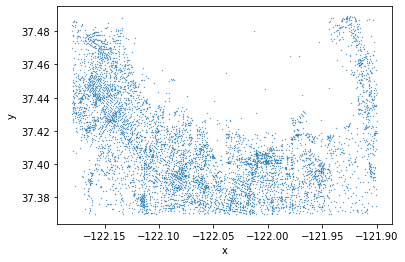

In [43]:
blocks_subset.plot(kind='scatter', x='x', y='y', s=0.1)

## Initialize the Pandana network

Let's initialize our Pandana network object using our transit and pedestrian network we created. Note: the `from_int` and `to_int` as well as the `twoway=False` denoting this is a explicit one way network.

In [44]:
s_time = time.time()
transit_ped_net = pdna.Network(urbanaccess_net.net_nodes["x"],
                               urbanaccess_net.net_nodes["y"],
                               urbanaccess_net.net_edges["from_int"],
                               urbanaccess_net.net_edges["to_int"],
                               urbanaccess_net.net_edges[["weight"]], 
                               twoway=False)
print('Took {:,.2f} seconds'.format(time.time() - s_time))



Took 26.79 seconds


Now let's set our blocks on to the network

In [45]:
blocks_subset['node_id'] = transit_ped_net.get_node_ids(blocks_subset['x'], blocks_subset['y'])
blocks_subset

,x,y,res_rents,res_values,square_meters_land,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21,node_id
060014415031030,-122.012501,37.479924,1930.0,604100.000000,16017465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8108
060014415031127,-121.930455,37.488208,1930.0,604100.000000,33680,0.0,0.0,0.0,0.0,0.0,0.0,77.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,0.0,68.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,30251
060014415031128,-121.929625,37.487240,1930.0,604100.000000,46825,0.0,0.0,0.0,0.0,0.0,0.0,202.0,9.0,0.0,14.0,1.0,0.0,44.0,8.0,50.0,0.0,25.0,5.0,1.0,7.0,37.0,0.0,0.0,0.0,1.0,0.0,0.0,32000
060014415031129,-121.927641,37.482614,1930.0,604100.000000,192190,0.0,0.0,0.0,0.0,0.0,0.0,668.0,5.0,0.0,35.0,1.0,14.0,478.0,42.0,0.0,2.0,0.0,0.0,91.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1611
060014415031130,-121.928148,37.485618,1930.0,604100.000000,41233,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
060855130003003,-122.153485,37.427282,1238.0,623776.812093,2359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53306
060855130003004,-122.151520,37.425527,1238.0,623776.812093,11200,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53237
060855130003005,-122.152818,37.423857,1238.0,623776.812093,15073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49773
060855130003006,-122.154190,37.422212,1238.0,623776.812093,7596,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3640


### Calculate cumulative accessibility

Now let's compute an accessibility metric, in this case a cumulative accessibility metric. See Pandana for other metrics that can be calculated. 

Let's set the block variables we want to use as our accessibly metric on the Pandana network. In this case let's use `jobs`

In [48]:
transit_ped_net.set(blocks_subset.node_id, variable = blocks_subset.jobs, name='jobs')

Now let's run an cumulative accessibility query using our network and the jobs variable for three different travel time thresholds: 15, 30, 45 minutes.

Note: Depending on network size, radius threshold, computer processing power, and whether or not you are using multiple cores the compute process may take some time.

The type of decay to apply, which makes things that are further away count less in the aggregation: ‘linear’, ‘exponential’, or ‘flat’ (no decay).

In [49]:
s_time = time.time()
jobs_45 = transit_ped_net.aggregate(45, type='sum', decay='linear', name='jobs') 
jobs_30 = transit_ped_net.aggregate(30, type='sum', decay='linear', name='jobs')
jobs_15 = transit_ped_net.aggregate(15, type='sum', decay='linear', name='jobs')
print('Took {:,.2f} seconds'.format(time.time() - s_time))

Took 176.02 seconds


Quickly visualize the accessibility query results. As expected, note that a travel time of 15 minutes results in a lower number of jobs accessible at each network node.

In [50]:
print(jobs_15.head())
print(jobs_30.head())
print(jobs_45.head())

id_int
1    11414.152698
2    11148.979557
3    11612.070379
4    12371.972745
5    14649.226096
dtype: float64
id_int
1    27504.493944
2    27530.692322
3    27955.956392
4    28550.955576
5    30247.345158
dtype: float64
id_int
1    42195.389429
2    42415.965887
3    42938.282957
4    43601.626622
5    45552.615634
dtype: float64


### Jobs accessible within 15 minutes

Note how the radius of the number of jobs accessible expands as the time threshold increases where high accessibility is indicated in dark red. Clearly there is a huge breadth of jobs in the area but little public transit infrastructure with good headways to support it. The public transit reaches these jobs in time greater than 30-45 minutes, which gives ample evidence as to why this is not a feasible option for many employees. If proper transit infrastructure like that of Swyft cities comes into play the 15 minute accessibility would have many more dark red areas

In Particular check the y-axis scales for each of the visualizations and the differences

Took 0.73 seconds


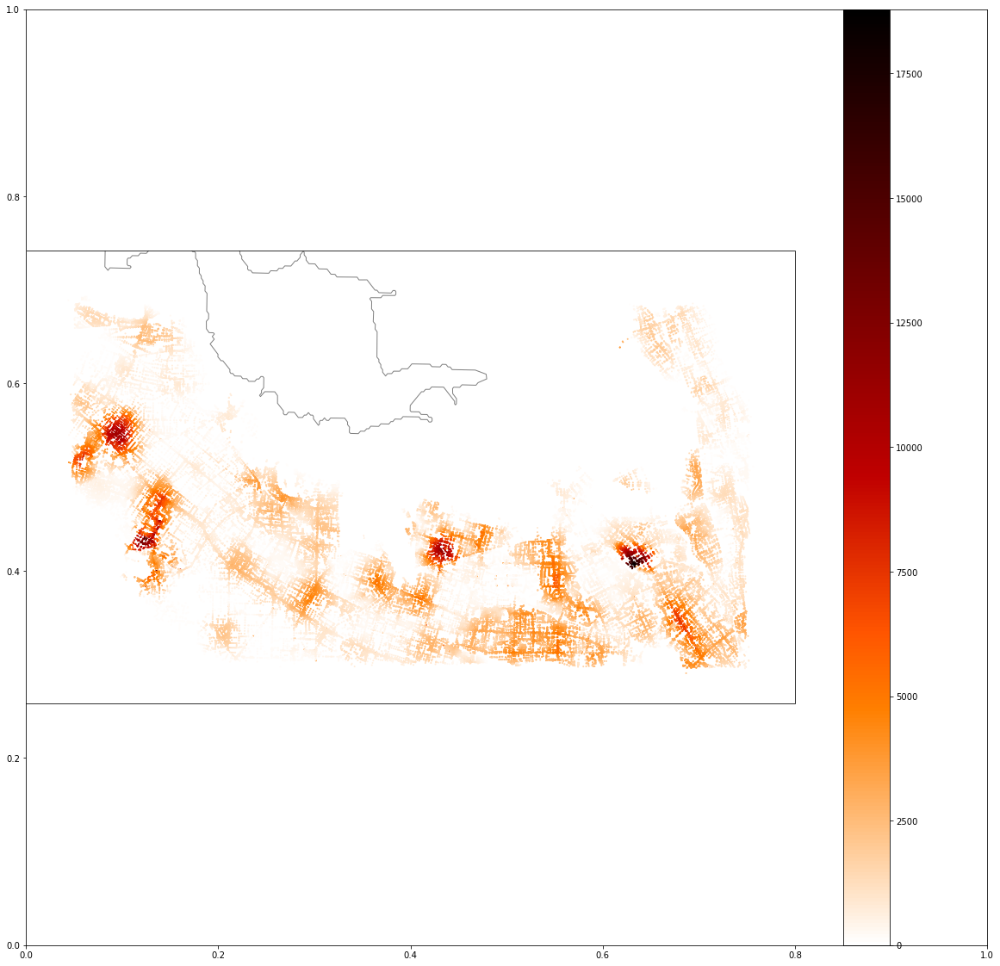

In [51]:
s_time = time.time()

fig = plt.subplots(figsize=(20,20))

data_crs = ccrs.PlateCarree()
ax = plt.axes(projection=ccrs.epsg(26943))
ax.add_feature(cartopy.feature.GSHHSFeature(scale='full'), edgecolor='grey')

plt.scatter(transit_ped_net.nodes_df.x, transit_ped_net.nodes_df.y, 
            c=jobs_15, s=4, cmap='gist_heat_r', edgecolor='none', transform=data_crs)
cb = plt.colorbar()

print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Jobs accessible within 30 minutes

Took 0.38 seconds


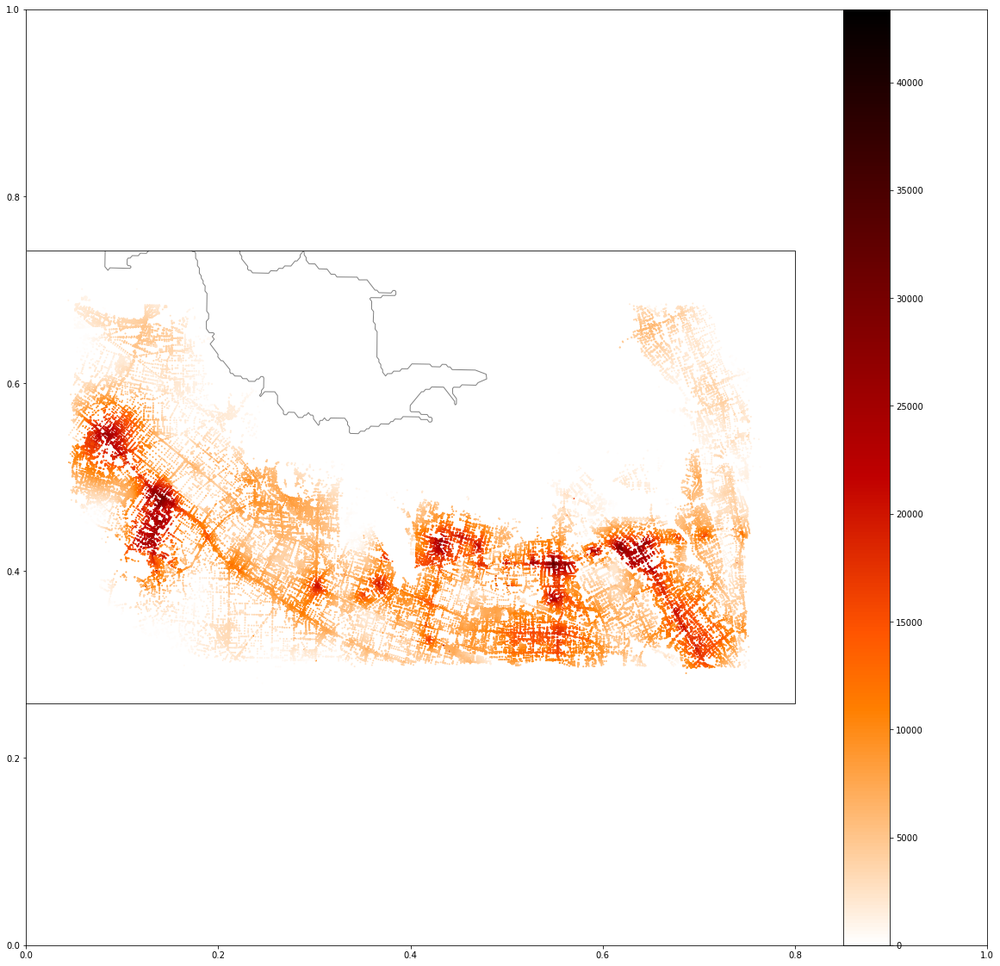

In [52]:
s_time = time.time()

fig = plt.subplots(figsize=(20,20))

data_crs = ccrs.PlateCarree()
ax = plt.axes(projection=ccrs.epsg(26943))
ax.add_feature(cartopy.feature.GSHHSFeature(scale='full'), edgecolor='grey')

plt.scatter(transit_ped_net.nodes_df.x, transit_ped_net.nodes_df.y, 
            c=jobs_30, s=4, cmap='gist_heat_r', edgecolor='none', transform=data_crs)
cb = plt.colorbar()

print('Took {:,.2f} seconds'.format(time.time() - s_time))

### Jobs accessible within 45 minutes

Took 0.36 seconds


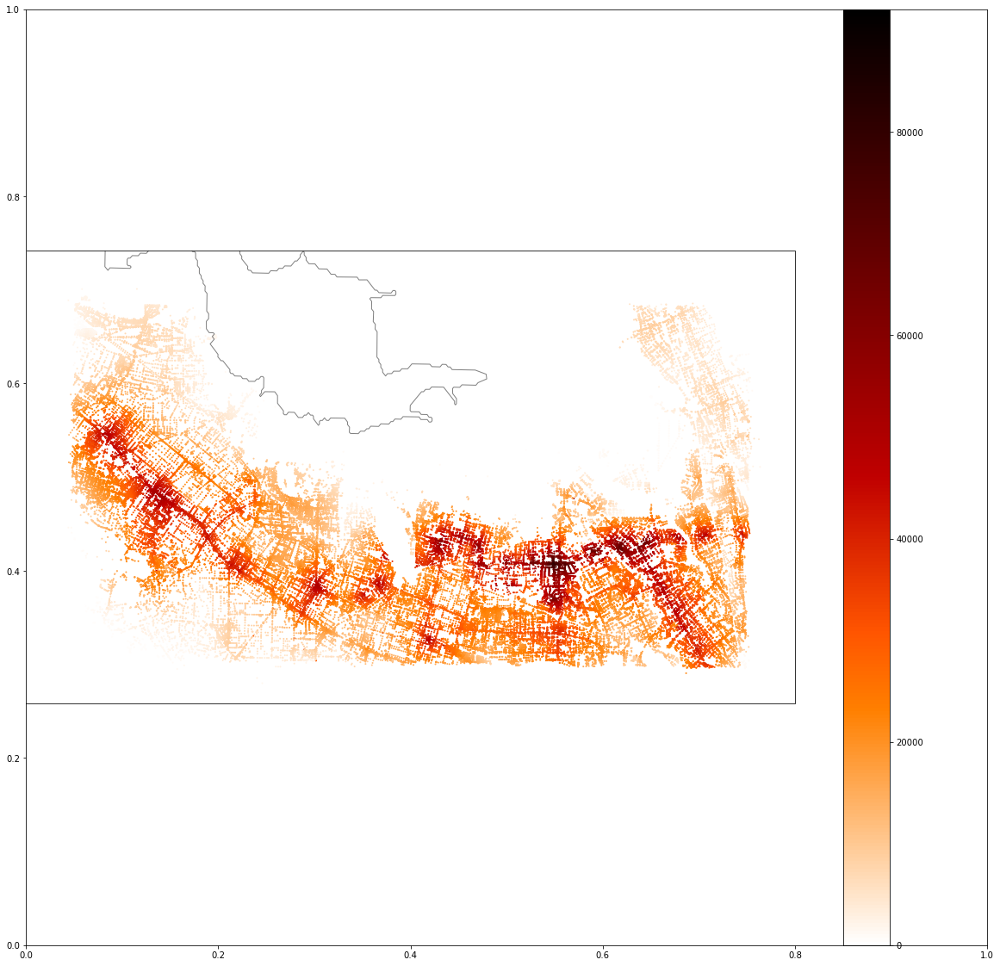

In [53]:
s_time = time.time()

fig = plt.subplots(figsize=(20,20))

data_crs = ccrs.PlateCarree()
ax = plt.axes(projection=ccrs.epsg(26943))
ax.add_feature(cartopy.feature.GSHHSFeature(scale='full'), edgecolor='grey')

plt.scatter(transit_ped_net.nodes_df.x, transit_ped_net.nodes_df.y, 
            c=jobs_45, s=4, cmap='gist_heat_r', edgecolor='none', transform=data_crs)
cb = plt.colorbar()

print('Took {:,.2f} seconds'.format(time.time() - s_time))

# Run and Create Regression Models based on Ridership and census block data 

## Data Filtering and Processing

In [88]:
blocks_subset

,x,y,res_rents,res_values,square_meters_land,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21,node_id
060014415031030,-122.012501,37.479924,1930.0,604100.000000,16017465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8108
060014415031127,-121.930455,37.488208,1930.0,604100.000000,33680,0.0,0.0,0.0,0.0,0.0,0.0,77.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,0.0,68.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,30251
060014415031128,-121.929625,37.487240,1930.0,604100.000000,46825,0.0,0.0,0.0,0.0,0.0,0.0,202.0,9.0,0.0,14.0,1.0,0.0,44.0,8.0,50.0,0.0,25.0,5.0,1.0,7.0,37.0,0.0,0.0,0.0,1.0,0.0,0.0,32000
060014415031129,-121.927641,37.482614,1930.0,604100.000000,192190,0.0,0.0,0.0,0.0,0.0,0.0,668.0,5.0,0.0,35.0,1.0,14.0,478.0,42.0,0.0,2.0,0.0,0.0,91.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1611
060014415031130,-121.928148,37.485618,1930.0,604100.000000,41233,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
060855130003003,-122.153485,37.427282,1238.0,623776.812093,2359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53306
060855130003004,-122.151520,37.425527,1238.0,623776.812093,11200,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53237
060855130003005,-122.152818,37.423857,1238.0,623776.812093,15073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49773
060855130003006,-122.154190,37.422212,1238.0,623776.812093,7596,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3640


In [89]:
#Merge the transit data with the blocks+job accesibility dataframe
df_merged = pd.merge(blocks_subset, urbanaccess_net.net_nodes, left_on='node_id', right_on='id_int') 
df_merged

,x_x,y_x,res_rents,res_values,square_meters_land,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21,node_id,id,x_y,y_y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type
0,-122.012501,37.479924,1930.0,604100.000000,16017465,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8108,259223086,-121.954320,37.399482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
1,-121.930455,37.488208,1930.0,604100.000000,33680,0.0,0.0,0.0,0.0,0.0,0.0,77.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,0.0,68.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,30251,3694075567,-121.945845,37.404787,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
2,-121.929625,37.487240,1930.0,604100.000000,46825,0.0,0.0,0.0,0.0,0.0,0.0,202.0,9.0,0.0,14.0,1.0,0.0,44.0,8.0,50.0,0.0,25.0,5.0,1.0,7.0,37.0,0.0,0.0,0.0,1.0,0.0,0.0,32000,3876157833,-121.927422,37.466970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
3,-121.927641,37.482614,1930.0,604100.000000,192190,0.0,0.0,0.0,0.0,0.0,0.0,668.0,5.0,0.0,35.0,1.0,14.0,478.0,42.0,0.0,2.0,0.0,0.0,91.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1611,65402449,-122.002383,37.404622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
4,-121.928148,37.485618,1930.0,604100.000000,41233,0.0,0.0,0.0,0.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32057,3876166930,-121.938436,37.470422,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5806,-122.153485,37.427282,1238.0,623776.812093,2359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53306,6260706323,-122.104222,37.422613,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
5807,-122.151520,37.425527,1238.0,623776.812093,11200,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53237,6257162216,-122.062415,37.411832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
5808,-122.152818,37.423857,1238.0,623776.812093,15073,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49773,5549346089,-121.962110,37.392746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk
5809,-122.154190,37.422212,1238.0,623776.812093,7596,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3640,65474142,-122.176170,37.459321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,walk


In [95]:
#Filter clean data with proper O-D pairs and proper agency identification 
df_vta = df_merged.loc[df_merged['unique_agency_id'] == 'vta']
df_vta

,x_x,y_x,res_rents,res_values,square_meters_land,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21,node_id,id,x_y,y_y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type
734,-121.907745,37.457761,1015.0,4.547000e+05,15791,19.0,69.0,25.0,21.0,2.421053,68303.684211,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,593,4386_vta,-122.144451,37.398646,vta,3.0,4386,Hillview & Coyote Hill,NaN,64386.0,1.0,NaN,0.0,transit
824,-121.901740,37.408213,1409.0,3.877000e+05,139596,162.0,479.0,264.0,103.0,2.166667,81868.487654,230.0,3.0,0.0,53.0,0.0,1.0,0.0,2.0,0.0,16.0,31.0,0.0,114.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,578,4347_vta,-122.145473,37.408113,vta,3.0,4347,Hillview & Watkins-Johnson,NaN,64347.0,1.0,NaN,0.0,transit
895,-121.907060,37.432469,1771.0,4.521000e+05,18945,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,585,4354_vta,-122.149301,37.420834,vta,3.0,4354,California & Oberlin,NaN,64354.0,1.0,NaN,0.0,transit
1087,-122.097748,37.427906,934.0,9.040000e+04,1474,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,661,4765_vta,-121.928715,37.387197,vta,0.0,4765,Bonaventura Station,PS_BONA,64765.0,1.0,NaN,0.0,transit
1220,-122.027603,37.410272,1161.0,4.116000e+05,17035,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,488,2530_vta,-121.984177,37.403968,vta,3.0,2530,Patrick Henry & Tasman,NaN,62530.0,1.0,NaN,0.0,transit
1349,-122.058907,37.411784,1991.0,6.237768e+05,2424,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit
1350,-122.058704,37.411367,1991.0,6.237768e+05,5707,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit
1355,-122.058496,37.410956,1991.0,6.237768e+05,2380,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,294,1957_vta,-121.980238,37.404025,vta,3.0,1957,Old Ironsides & Tasman,PS_OLDI,61957.0,1.0,NaN,0.0,transit
1443,-121.992071,37.403332,1260.0,7.060000e+04,1233,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,445,2413_vta,-121.982680,37.380334,vta,3.0,2413,Scott & Oakmead Village,NaN,62413.0,1.0,NaN,0.0,transit
1551,-122.012325,37.399485,1955.0,4.609000e+05,20817,73.0,167.0,88.0,31.0,1.767123,141798.575342,141.0,54.0,0.0,0.0,0.0,0.0,43.0,40.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,482,2521_vta,-121.977599,37.373764,vta,3.0,2521,Bowers & Walsh,NaN,62521.0,1.0,NaN,0.0,transit


In [96]:
Riders = pd.DataFrame({'stop_name':df_vta['stop_name']})
RidershipDaily = [46,21,0,196,2,1,1,186,0,2,19,2,9,10,1,2,29,1,10,58,80,9,8,0,6,35,22,2,2,38,1] #Obtained from subset of VTA Ridership Tableu Graph
RidershipWeekly = []
for ADB in RidershipDaily:
    RidershipWeekly.append(ADB*5)
Riders['WeeklyRidership'] = RidershipWeekly
Riders


,stop_name,WeeklyRidership
734,Hillview & Coyote Hill,230
824,Hillview & Watkins-Johnson,105
895,California & Oberlin,0
1087,Bonaventura Station,980
1220,Patrick Henry & Tasman,10
1349,Shoreline & Middlefield,5
1350,Shoreline & Middlefield,5
1355,Old Ironsides & Tasman,930
1443,Scott & Oakmead Village,0
1551,Bowers & Walsh,10


In [140]:
#Final Model dataframe with Ridership
df_Final = pd.merge(df_vta, Riders, left_on='stop_name', right_on='stop_name')
df_Final = df_Final.rename(columns = {'res_rents':'ResRentValues','res_values':'ResHomeValues','square_meters_land':'LandArea'})
df_Final

,x_x,y_x,ResRentValues,ResHomeValues,LandArea,households,persons,workers,children,cars,income,jobs,54,71,81,51,23,3133,42,52,56,4445,62,61,53,72,92,4849,55,22,11,21,node_id,id,x_y,y_y,unique_agency_id,route_type,stop_id,stop_name,parent_station,stop_code,wheelchair_boarding,zone_id,location_type,net_type,WeeklyRidership
0,-121.907745,37.457761,1015.0,4.547000e+05,15791,19.0,69.0,25.0,21.0,2.421053,68303.684211,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,593,4386_vta,-122.144451,37.398646,vta,3.0,4386,Hillview & Coyote Hill,NaN,64386.0,1.0,NaN,0.0,transit,230
1,-121.901740,37.408213,1409.0,3.877000e+05,139596,162.0,479.0,264.0,103.0,2.166667,81868.487654,230.0,3.0,0.0,53.0,0.0,1.0,0.0,2.0,0.0,16.0,31.0,0.0,114.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,578,4347_vta,-122.145473,37.408113,vta,3.0,4347,Hillview & Watkins-Johnson,NaN,64347.0,1.0,NaN,0.0,transit,105
2,-121.907060,37.432469,1771.0,4.521000e+05,18945,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,585,4354_vta,-122.149301,37.420834,vta,3.0,4354,California & Oberlin,NaN,64354.0,1.0,NaN,0.0,transit,0
3,-122.097748,37.427906,934.0,9.040000e+04,1474,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,661,4765_vta,-121.928715,37.387197,vta,0.0,4765,Bonaventura Station,PS_BONA,64765.0,1.0,NaN,0.0,transit,980
4,-122.027603,37.410272,1161.0,4.116000e+05,17035,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,488,2530_vta,-121.984177,37.403968,vta,3.0,2530,Patrick Henry & Tasman,NaN,62530.0,1.0,NaN,0.0,transit,10
5,-122.058907,37.411784,1991.0,6.237768e+05,2424,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit,5
6,-122.058907,37.411784,1991.0,6.237768e+05,2424,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit,5
7,-122.058704,37.411367,1991.0,6.237768e+05,5707,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit,5
8,-122.058704,37.411367,1991.0,6.237768e+05,5707,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,312,2003_vta,-122.077967,37.406832,vta,3.0,2003,Shoreline & Middlefield,NaN,62003.0,0.0,NaN,0.0,transit,5
9,-122.058496,37.410956,1991.0,6.237768e+05,2380,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,294,1957_vta,-121.980238,37.404025,vta,3.0,1957,Old Ironsides & Tasman,PS_OLDI,61957.0,1.0,NaN,0.0,transit,930


In [158]:
import statsmodels.api as sm
plt.rc("figure", figsize=(24, 12))
plt.rc("font", size=14)

In [139]:
from patsy import dmatrices

In [144]:
y, X = dmatrices('WeeklyRidership ~ ResRentValues + ResHomeValues + LandArea + households + workers + cars + income + jobs', data=df_Final, return_type='dataframe')


## Least Squares Model

In [148]:
LSmod = sm.OLS(y, X)    # Describe model
LS = LSmod.fit()       # Fit Least Squares model
print(LS.summary())  #Print Summary

                            OLS Regression Results                            
Dep. Variable:        WeeklyRidership   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                 -0.160
Method:                 Least Squares   F-statistic:                    0.4133
Date:                Fri, 15 Apr 2022   Prob (F-statistic):              0.902
Time:                        16:19:53   Log-Likelihood:                -237.23
No. Observations:                  35   AIC:                             492.5
Df Residuals:                      26   BIC:                             506.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       462.0010    231.923      1.992

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


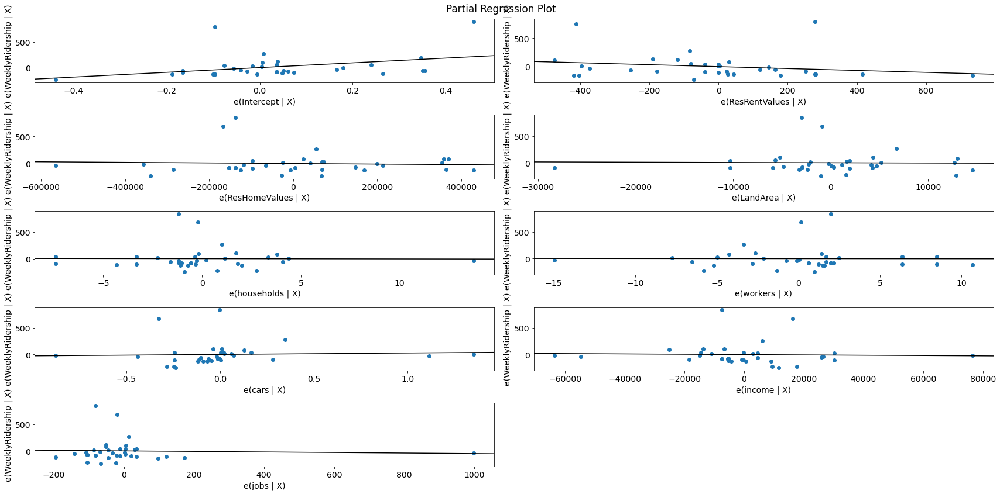

In [159]:
fig = sm.graphics.plot_partregress_grid(LS)

## Poisson Model

In [156]:
POISmodel = sm.GLM(y,X,family = sm.families.Poisson()).fit()
print(POISmodel.summary()) 


                 Generalized Linear Model Regression Results                  
Dep. Variable:        WeeklyRidership   No. Observations:                   35
Model:                            GLM   Df Residuals:                       26
Model Family:                 Poisson   Df Model:                            8
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3831.1
Date:                Fri, 15 Apr 2022   Deviance:                       7488.7
Time:                        16:24:05   Pearson chi2:                 1.20e+04
No. Iterations:                     6   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         7.0095      0.071     98.107

## Negatieve Binomial Model

In [157]:
NBmodel = sm.GLM(y,X,family = sm.families.NegativeBinomial()).fit()
print(NBmodel.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:        WeeklyRidership   No. Observations:                   35
Model:                            GLM   Df Residuals:                       26
Model Family:        NegativeBinomial   Df Model:                            8
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -195.84
Date:                Fri, 15 Apr 2022   Deviance:                       96.760
Time:                        16:24:33   Pearson chi2:                     112.
No. Iterations:                    18   Pseudo R-squ. (CS):             0.3099
Covariance Type:            nonrobust                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         6.6262      0.944      7.022